# CellVoyant: Automate extraction of per-cell statistics

##  Overview
• The task is to implement a python script, preferably on Jupiter book to automate extraction of statistics from
images of cells (in the provided testing set zip file) namely: number of cells, per-cell areas, and centroid, as well
as (optional) approximation of density of cells
• Candidates could employ any available open-source materials including but not limited to, codes, data, packages,
free services
• Links and references are provided for aiding and assisting purposes, but candidates can pursue their own routes
to complete the task
• It is recommended to prioritise completing and cleaning the pipeline before focusing on results and performance
• Candidates should output quantitative and qualitative outputs. For example, a csv file for the statistics and
images of the overlayed predicted mask
Dataset
• Data is attached, it consists of 261 1228x1228 8-bit tiff images
• Data are divided into two sets: “TrainVal.zip” for training/ validating the model and “Test.zip” from which the
statistics stated above should be extracted

## Solution

I use Centermask model pretrained on Sartorius LIVECell data and finetuned on CellVoyant data to solve the task at hand. LIVECell is one of the largest cell-segmentation datasets (https://www.nature.com/articles/s41592-021-01249-6). Zero-shot inference with LIVECell-pretrained models produce decent results. This is a good evidence of effectiveness of transfer learning from LIVECell models.


The following steps are implemented in the notebook to solve the problem:
1. Dataset generation and Brief EDA.
2. Images are preprocessed to match LIVECell data distribution. This is done to improve effectiveness of transfer learning.
3. Mechanical Turk cell annotation tasks are generated from CellVoyant dataset.
4. Mechanical Turk results are loaded and filtered.
5. Imputation of training data is done using optical flow information.
6. Training/validation/test sets are generated and saved in COCO format. COCO is the common format used by Detectron2 library.
7. Fine-tuning of the model on trainig data.
8. Best model is selected based on performance on validation set.
9. Test set performance is estimated
10. Statistics are calculated for every frame of the test set.

## Out of the scope/next steps
* Size and variety of training set is limited in this task. Collecting more samples is recommended.
* Implementing cross validation helps to improve metrics stability on small datasets.
* Hyperparameter tuning, selecting a better base model for transfer learning.
* Experiment with train data augmentations, test time augmentations.
* Quality of annotations from Mturk is subpar, there is a set of steps we can take to improve annotation quality.
* Better use of automated annotation methods. E.g. better optical flow models with higher framerate.
* Better use of temporal coherence of sequential images in inference stage. E.g. we could use optical flow to improve inference. Or we could work with 3D convolutions instead.
* Better understanding of internal morphology of cells.

# Utils, constants

In [75]:
import base64
import glob
import io
import os
import re
import sys

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageEnhance
from PIL import ImageDraw
from PIL import ImageFilter
from detectron2.data import DatasetCatalog
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultPredictor
from tqdm import tqdm

import preprocessing
from train_net import Trainer

IMAGES_DIR = "data/cellvoyant/TrainTest"
IMG_SIZE = (400, 400)
IMG_SCALE = IMG_SIZE[0] / 1228
ANNOTATION_SPARSITY = 20  # Reduce to increase the number of annotations
OPTICAL_FLOW = True
THRESHOLD = 0.5

sys.path.append('/home/vslaykovsky/cellvoyant/centermask2')
sys.path.append('/home/vslaykovsky/cellvoyant/centermask2/demo')

from centermask2.centermask import config
import centermask
import demo

# Quick EDA

TrainVal contains 2 sets of images taken for different samples of cells. Test set contains 1 set of images from cell samples that also appear in the training set!
Training/test data samples are highly correlated because photos are taken within short period of time. This might result in certain side effects like **overfitting and data leakage**.

In [76]:
def gen_ds(files=glob.glob('data/cellvoyant/TrainVal/*ome_8bit.tif') + glob.glob('data/cellvoyant/Test/*ome_8bit.tif')):
    df_ds = []
    for f in files:
        m = re.match('(.*)-([0-9]+).ome_8bit.tif', os.path.basename(f))
        if m is None:
            print('Skipping', f)
            continue
        split = os.path.basename(os.path.dirname(f))
        df_ds.append({
            'sequence': m[1],
            'idx': int(m[2]),
            'fname': f'data/cellvoyant/{split}/{m[0]}',
            'split': split,
            'image_url': f'https://storage.googleapis.com/vslaykovsky/cv/{m[0]}.png'
        })
    df_ds = pd.DataFrame(df_ds).sort_values(['sequence', 'idx']).reset_index(drop=True)
    return df_ds


df_ds = gen_ds()
df_ds

,sequence,idx,fname,split,image_url
0,E10_10,1,data/cellvoyant/TrainVal/E10_10-1.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
1,E10_10,2,data/cellvoyant/TrainVal/E10_10-2.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
2,E10_10,3,data/cellvoyant/TrainVal/E10_10-3.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
3,E10_10,4,data/cellvoyant/TrainVal/E10_10-4.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
4,E10_10,5,data/cellvoyant/TrainVal/E10_10-5.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
...,...,...,...,...,...
211,E11_11,104,data/cellvoyant/TrainVal/E11_11-104.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
212,E11_11,105,data/cellvoyant/TrainVal/E11_11-105.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
213,E11_11,106,data/cellvoyant/TrainVal/E11_11-106.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...
214,E11_11,107,data/cellvoyant/TrainVal/E11_11-107.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...


<AxesSubplot:title={'center':'Data samples by sequence'}, ylabel='split,sequence'>

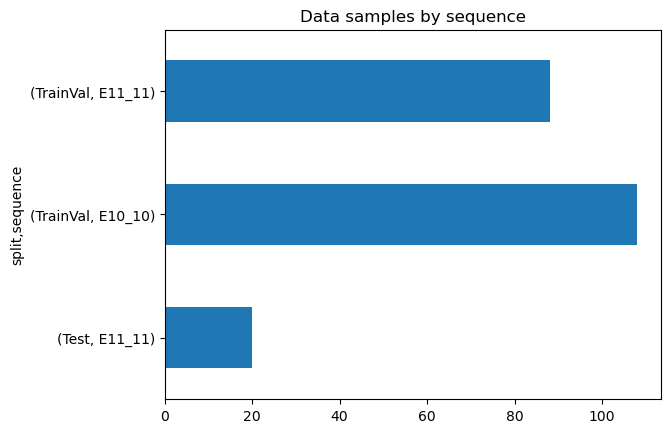

In [77]:
df_ds.groupby(['split', 'sequence']).idx.count().plot.barh(title='Data samples by sequence')

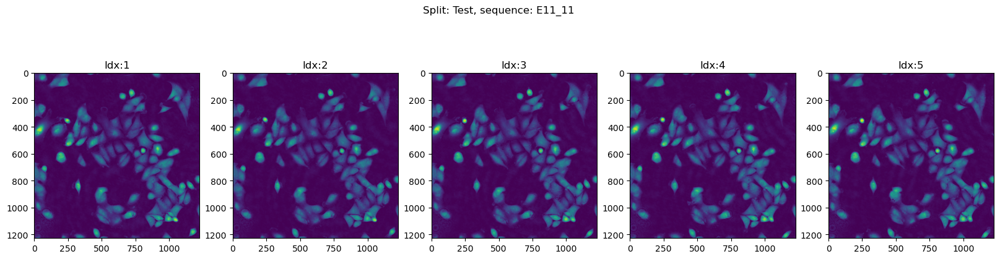

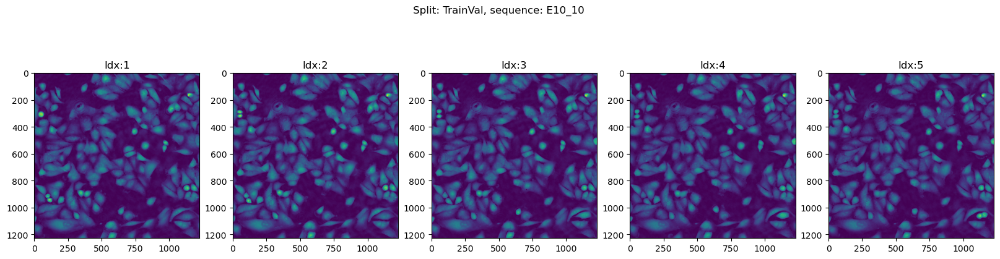

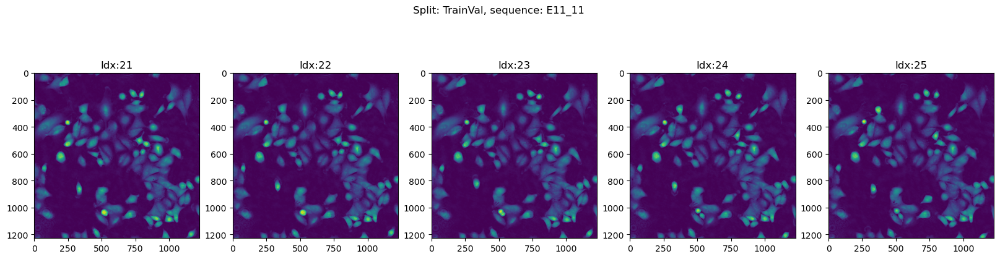

In [78]:
for (split, seq), g in df_ds.groupby(['split', 'sequence']):
    plt.figure(figsize=(20, 5))
    plt.suptitle(f'Split: {split}, sequence: {seq}')
    for i, (_, r) in enumerate(g.head(5).iterrows()):
        plt.subplot(1, 5, i + 1).imshow(Image.open(r.fname))
        plt.subplot(1, 5, i + 1).set_title(f'Idx:{r.idx}')

# Preprocess Images

Images are preprocessed using transformation

In [79]:
def RCNN_preprocess(fname):
    #read the image
    im = Image.open(fname)
    enhancer = ImageEnhance.Contrast(im)
    im = enhancer.enhance(2)
    # enhancer = ImageEnhance.Sharpness(im)
    # im = enhancer.enhance(5)
    im = im.filter(ImageFilter.MedianFilter(5))
    im = im.resize(IMG_SIZE)
    im = preprocessing.preprocess_fluorescence(np.array(im))
    return im

for fname in tqdm(glob.glob(f'data/cellvoyant/TrainVal/*') + glob.glob(f'data/cellvoyant/Test/*')):
    fname = os.path.basename(fname)
    dest_file= f'{IMAGES_DIR}/{fname}'
    if os.path.exists(dest_file):
        continue
    im = RCNN_preprocess(fname)
    cv2.imwrite(dest_file, im)

100%|██████████| 216/216 [00:00<00:00, 179755.89it/s]


Text(0.5, 1.0, 'LIVECell Preprocessed Image')

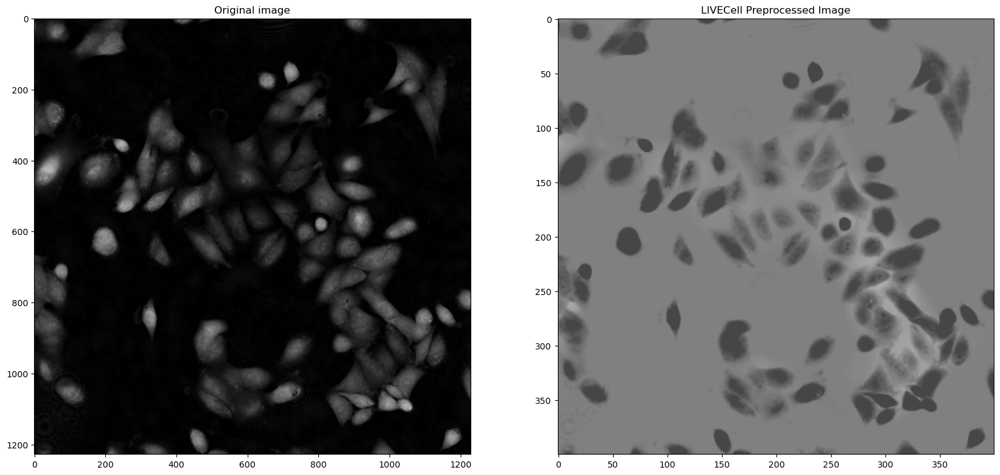

In [80]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1).imshow(cv2.imread('data/cellvoyant/Test/E11_11-1.ome_8bit.tif'))
plt.subplot(1, 2, 1).set_title('Original image')
plt.subplot(1, 2, 2).imshow(cv2.imread('data/cellvoyant/TrainTest/E11_11-1.ome_8bit.tif'))
plt.subplot(1, 2, 2).set_title('LIVECell Preprocessed Image')

# Generate Mturk tasks

In [81]:
df_ds.to_csv('data/cellvoyant/dataset.csv', index=False)
# df_ds.groupby('sequence', as_index=False).apply(lambda df: df.iloc[::ANNOTATION_SPARSITY]).to_csv('data/cellvoyant/annotation.csv', index=False)
df_ds.query('sequence == "E11_11" and idx == 21') .to_csv('data/cellvoyant/annotation.csv', index=False)
!cat data/cellvoyant/annotation.csv

sequence,idx,fname,split,image_url
E11_11,21,data/cellvoyant/TrainVal/E11_11-21.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/E11_11-21.ome_8bit.tif.png


# Import Mturk Annotations

* We only use approved annotations.
* Following conclusions from EDA above we split data into train/val/test using the following logic:
        * train/val data comes from `TrainVal` folder
        * train/val split is based on `sequence` name. So the same cells never appear both in `train` and `val` sets. This prevents test and val data leakage and makes metrics more robust. This is similar to `GroupShuffleSplit` from sklearn with group==sequence.
        * val sequence == test sequence == `E11_11`. This guarantees that val and test come from a similar distribution. This way optimizing hyperparameters and using early stopping with val sequence helps to improve test performance as well.


In [82]:
MTURK_RESULT_FILES =glob.glob('data/cellvoyant/Batch_*.csv')
# HIGH_QUALITY_WORKERS = ['A1V2H0UF94ATWY', 'A1IOMFFEKCWOIT']
BLACKLIST_ASSIGNMENTS = ['31N2WW6R9RPAHLMJKPLIWF0A4N4F3O']

In [83]:
def prepare_mask(mask):
    return mask.resize(IMG_SIZE).convert('RGB')

df_ann = pd.concat([pd.read_csv(fname) for fname in MTURK_RESULT_FILES], axis=0)
df_ann = df_ann[df_ann['AssignmentStatus'] == 'Approved']
df_ann.loc[(df_ann['Input.split'] == 'TrainVal'), 'Input.split'] = 'Train'
df_ann.loc[(df_ann['Input.split'] == 'Train') & (df_ann['Input.sequence'] == 'E11_11'), 'Input.split'] = 'Val'
df_ann['Answer.annotatedResult.instances'] = df_ann['Answer.annotatedResult.instances'].apply(eval)
df_ann['Input.fname'] = df_ann['Input.fname'].apply(lambda v: os.path.basename(v))
df_ann['Answer.annotatedResult.labeledImage.pngImageData'] = df_ann['Answer.annotatedResult.labeledImage.pngImageData'].apply(lambda v: prepare_mask(Image.open(io.BytesIO(base64.b64decode(v)))))
df_ann = df_ann[[c for c in df_ann.columns if re.match('Input|Answer|WorkerId|AssignmentId|HITId', c)]]
df_ann = df_ann[~df_ann.AssignmentId.isin(BLACKLIST_ASSIGNMENTS)]
df_ann

,HITId,AssignmentId,WorkerId,Input.sequence,Input.idx,Input.fname,Input.split,Input.image_url,Answer.annotatedResult.inputImageProperties.height,Answer.annotatedResult.inputImageProperties.width,Answer.annotatedResult.instances,Answer.annotatedResult.labeledImage.pngImageData
0,3X2LT8FDHVHV7KGQWSLC30YTEA78WU,3EQHHY4HQSRJ905I9SFTTXY6KMH5G2,A1IOMFFEKCWOIT,E10_10,1,E10_10-1.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
3,3QGTX7BCHO1GEX2T9HYGQKIKTL2Z5Z,3K5TEWLKGVAE3LQS57X9I75LBZXVI0,A1V2H0UF94ATWY,E11_11,1,E11_11-1.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#1f77b4', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
0,3W31J70BARV6ONCMOQIEHB0HHVCCK3,336YQZE83VDJ1A14KVDO62I3GG8M5M,A1IOMFFEKCWOIT,E10_10,61,E10_10-61.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
1,34ZTTGSNJWNJGYLXNNGCOO96TT9HQ9,32N49TQG3GHZX37UTJ5W19H2ZNPVAM,A1IOMFFEKCWOIT,E10_10,91,E10_10-91.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...


In [84]:
def get_contours(mask):
    result = []
    for inst in np.unique(mask):
        if inst == 0:
            continue
        cont, _ = cv2.findContours(np.where(mask == inst, 1, 0).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        for i in range(len(cont)):
            cnt = cont[i].squeeze(1)
            result.append(np.concatenate([cnt, cnt[:1]]))
    return result


In [85]:
df_ann

,HITId,AssignmentId,WorkerId,Input.sequence,Input.idx,Input.fname,Input.split,Input.image_url,Answer.annotatedResult.inputImageProperties.height,Answer.annotatedResult.inputImageProperties.width,Answer.annotatedResult.instances,Answer.annotatedResult.labeledImage.pngImageData
0,3X2LT8FDHVHV7KGQWSLC30YTEA78WU,3EQHHY4HQSRJ905I9SFTTXY6KMH5G2,A1IOMFFEKCWOIT,E10_10,1,E10_10-1.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
3,3QGTX7BCHO1GEX2T9HYGQKIKTL2Z5Z,3K5TEWLKGVAE3LQS57X9I75LBZXVI0,A1V2H0UF94ATWY,E11_11,1,E11_11-1.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#1f77b4', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
0,3W31J70BARV6ONCMOQIEHB0HHVCCK3,336YQZE83VDJ1A14KVDO62I3GG8M5M,A1IOMFFEKCWOIT,E10_10,61,E10_10-61.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
1,34ZTTGSNJWNJGYLXNNGCOO96TT9HQ9,32N49TQG3GHZX37UTJ5W19H2ZNPVAM,A1IOMFFEKCWOIT,E10_10,91,E10_10-91.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228,1228,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...


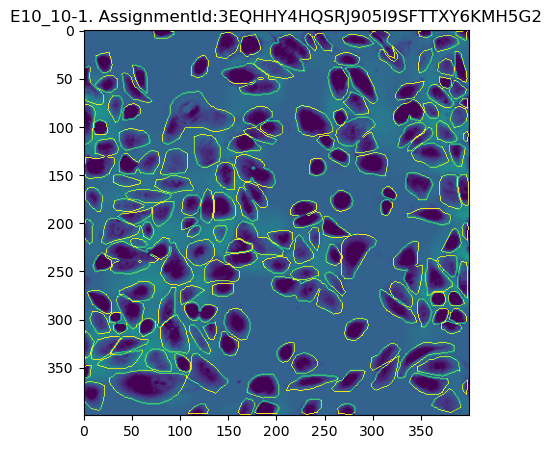

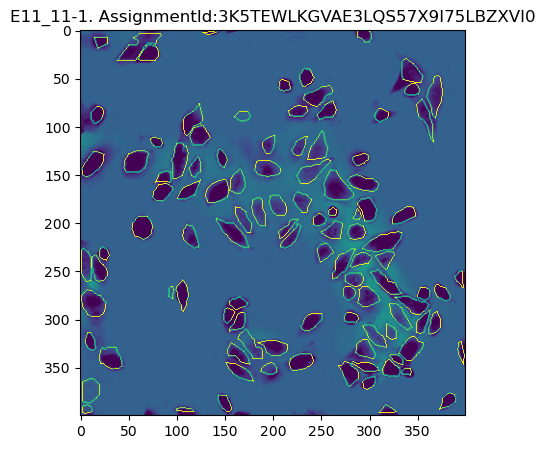

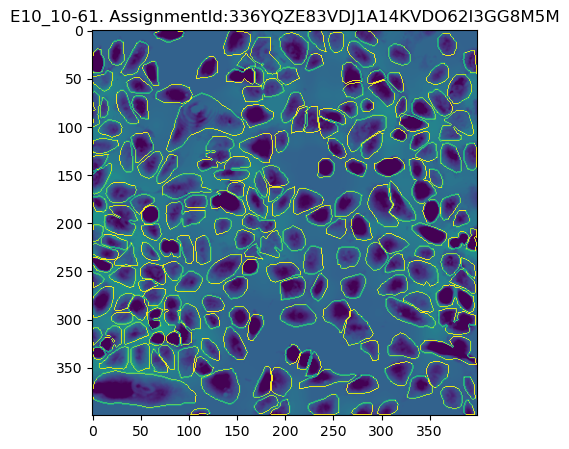

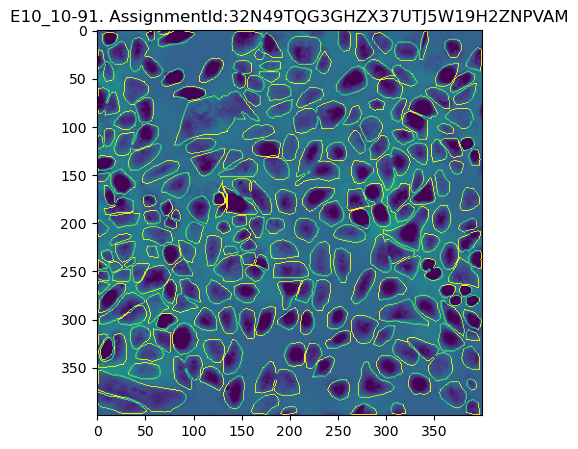

In [86]:
def draw_contours(mask, img):
    draw = ImageDraw.Draw(img)
    contours = get_contours(mask)
    for contour in contours:
        draw.line([(x, y) for x, y in contour], fill='white')


for _, hit in df_ann.iterrows():
    img = Image.open(f'data/cellvoyant/TrainTest/{os.path.basename(hit["Input.fname"])}').resize(IMG_SIZE)
    draw_contours(np.array(hit['Answer.annotatedResult.labeledImage.pngImageData'])[:, :, 0], img)
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f'{hit["Input.sequence"]}-{hit["Input.idx"]}. AssignmentId:{hit["AssignmentId"]}')

# Bonus: Data imputation with Optical Flow


**Optical Flow** is a set of methods that help to detect difference between consecutive images in the video stream.
Here we use Optical Flow to approximate annotations between ground truth annotations collected from Mturk. This is done to cheaply grow annotated set.
Currently, each annotated image cost me 6$, so adding N annotated images "for free" for each ground truth annotation is always welcome.

How does it work:
1. We define a sequence of cell images with gaps in annotations.
2. Optical Flow produces 2D _vector fields_ for each pair of similar images where a 2D vector is generated for each pixel of a source image. This 2D vector transforms the pixel to its target location in the destination image of the pair.
3. We can use resulting 2D vector fields to transform ground truth cell annotations to produce annotations of neighbour images.


**Note:** right now Optical Flow is not used to impute training data, but this feature can be easily enabled.


In [87]:
def get_flow(im1, im2):
    flow = cv2.calcOpticalFlowFarneback(im1, im2, None, 0.5, 3, 15, 3, 5, 1.2, 0) # TODO optimize parameters
    return flow

f1 = f'data/cellvoyant/TrainTest/E11_11-1.ome_8bit.tif'
f2 = f'data/cellvoyant/TrainTest/E11_11-3.ome_8bit.tif'
flow = get_flow(np.array(Image.open(f1)), np.array(Image.open(f2)))
flow.shape

(400, 400, 2)

Text(0.5, 1.0, 'Annotation extrapolated with dense optical flow')

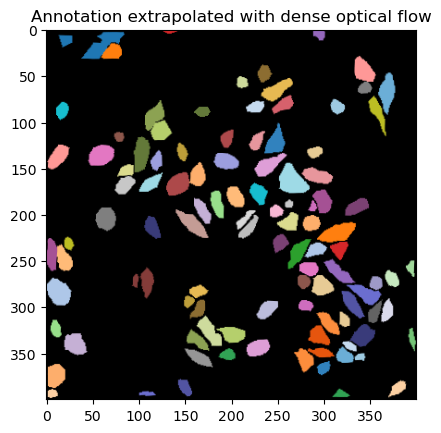

In [88]:
def remap_image(im1, flow):
    height, width = flow.shape[:2]
    R2 = np.dstack(np.meshgrid(np.arange(width), np.arange(height)))
    pixel_map = R2 - flow
    new_frame = cv2.remap(im1, map1=pixel_map.astype(np.float32), map2=None, interpolation=cv2.INTER_LINEAR)
    return new_frame


ann1 = np.array((df_ann.query('`Input.fname` == "E11_11-1.ome_8bit.tif"').iloc[0]['Answer.annotatedResult.labeledImage.pngImageData']))
ann2 = remap_image(ann1, flow)
plt.imshow(ann2)
plt.title("Annotation extrapolated with dense optical flow")

In [89]:
df_ds = pd.merge(gen_ds(), df_ann, left_on=('sequence', 'idx'), right_on=('Input.sequence', 'Input.idx'), how='left')
df_ds

,sequence,idx,fname,split,image_url,HITId,AssignmentId,WorkerId,Input.sequence,Input.idx,Input.fname,Input.split,Input.image_url,Answer.annotatedResult.inputImageProperties.height,Answer.annotatedResult.inputImageProperties.width,Answer.annotatedResult.instances,Answer.annotatedResult.labeledImage.pngImageData
0,E10_10,1,data/cellvoyant/TrainVal/E10_10-1.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,3X2LT8FDHVHV7KGQWSLC30YTEA78WU,3EQHHY4HQSRJ905I9SFTTXY6KMH5G2,A1IOMFFEKCWOIT,E10_10,1.0,E10_10-1.ome_8bit.tif,Train,https://storage.googleapis.com/vslaykovsky/cv/...,1228.0,1228.0,"[{'color': '#2ca02c', 'label': 'Cell'}, {'colo...",<PIL.Image.Image image mode=RGB size=400x400 a...
1,E10_10,2,data/cellvoyant/TrainVal/E10_10-2.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E10_10,3,data/cellvoyant/TrainVal/E10_10-3.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,E10_10,4,data/cellvoyant/TrainVal/E10_10-4.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,E10_10,5,data/cellvoyant/TrainVal/E10_10-5.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,E11_11,104,data/cellvoyant/TrainVal/E11_11-104.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
212,E11_11,105,data/cellvoyant/TrainVal/E11_11-105.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
213,E11_11,106,data/cellvoyant/TrainVal/E11_11-106.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
214,E11_11,107,data/cellvoyant/TrainVal/E11_11-107.ome_8bit.tif,TrainVal,https://storage.googleapis.com/vslaykovsky/cv/...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


100%|██████████| 108/108 [00:00<00:00, 187.68it/s]
/tmp/ipykernel_17506/2814466250.py:29: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  df_ds['mask'] = np.array(df_ds.groupby('sequence').apply(lambda g: impute_with_optical_flow(g)).values.tolist()).flatten()


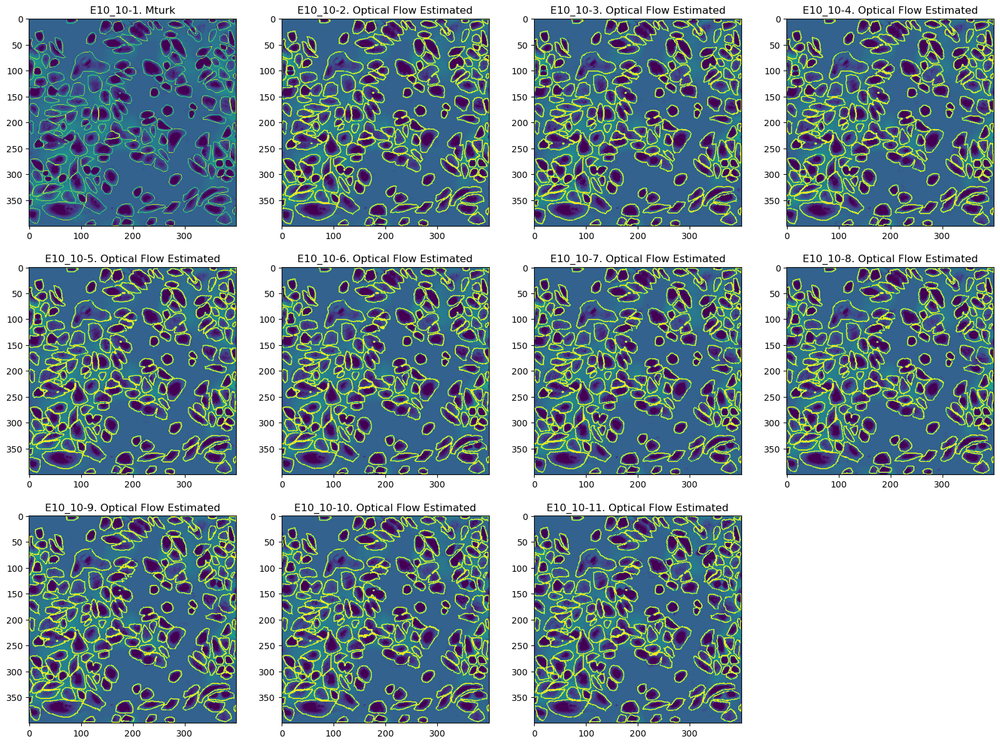

In [90]:
def impute_with_optical_flow(df):
    ann = df[~df['HITId'].isna()]
    gen_ann = []
    for _, r in tqdm(df.iterrows(), total=len(df)):
        if type(r['Answer.annotatedResult.labeledImage.pngImageData']) is Image.Image:
            # use ground truth
            gen_ann.append(np.array(r['Answer.annotatedResult.labeledImage.pngImageData']))
        else:
            # impute
            qidx = r.idx
            df_close_ann = ann.query('abs(@qidx - idx) <= @ANNOTATION_SPARSITY / 2').head(1)
            if len(df_close_ann) == 0:
                # ground truth images are too far apart
                gen_ann.append(None)
                continue

            img = np.array(Image.open(os.path.join(IMAGES_DIR, os.path.basename(r.fname))))
            mask = np.array(df_close_ann.iloc[0]['Answer.annotatedResult.labeledImage.pngImageData'])
            img_ann = np.array(Image.open(os.path.join(IMAGES_DIR, os.path.basename(df_close_ann.iloc[0]['fname']))))

            flow = get_flow(img_ann, img)
            rann = remap_image(mask, flow)

            gen_ann.append(rann)
    return gen_ann


df_ds['mask'] = np.array(df_ds.groupby('sequence').apply(lambda g: impute_with_optical_flow(g)).values.tolist()).flatten()
df_ds.head(1)

plt.figure(figsize=(20, 25))
for i, (_, r) in enumerate(df_ds.head(20).iterrows()):
    msk = r['mask']
    img = Image.open(f'data/cellvoyant/TrainTest/{os.path.basename(r["fname"])}')
    if type(msk) is np.ndarray:
        draw_contours(msk[:, :, 0], img)
        plt.subplot(5, 4, i + 1).imshow(img)
        plt.title(f'{r.sequence}-{r.idx}. {"Mturk" if type(r.HITId) is str else "Optical Flow Estimated"}')


# Generate data in COCO format

In [96]:
df_coco = df_ds[~df_ds['mask'].isna()]

In [91]:
def crc(s):
    from crc64iso.crc64iso import crc64
    return int(crc64(s), 16)

# quick test
crc('abc')

6379695974247301120

In [100]:
def im_stats(r):
    fname = os.path.basename(r["Input.fname"])
    im = Image.open(os.path.join(IMAGES_DIR, fname))
    w, h = im.size
    return {
        "id": crc(fname),
        "license": 1,
        "file_name": fname,
        "height": w,
        "width": h,
        "date_captured": None
    }

def get_images(df_ann):
    images = [
        im_stats(r)
        for _, r in tqdm(df_ann.iterrows(), total=len(df_ann))
    ]
    return images

# quick test
get_images(df_ann)


100%|██████████| 4/4 [00:00<00:00, 2462.89it/s]


[{'id': 8073361197822855845,
  'license': 1,
  'file_name': 'E10_10-1.ome_8bit.tif',
  'height': 400,
  'width': 400,
  'date_captured': None},
 {'id': 1979990537723660964,
  'license': 1,
  'file_name': 'E11_11-1.ome_8bit.tif',
  'height': 400,
  'width': 400,
  'date_captured': None},
 {'id': 5451277446048382392,
  'license': 1,
  'file_name': 'E10_10-61.ome_8bit.tif',
  'height': 400,
  'width': 400,
  'date_captured': None},
 {'id': 5451277446048379211,
  'license': 1,
  'file_name': 'E10_10-91.ome_8bit.tif',
  'height': 400,
  'width': 400,
  'date_captured': None}]

In [101]:
def get_bbox(contour):
    x1, x2, y1, y2 = np.min(contour[:, 0]), np.max(contour[:, 0]), np.min(contour[:, 1]), np.max(contour[:, 1])
    return np.array([x1, y1, x2 - x1, y2 - y1]).tolist()


In [102]:
def get_area(cnt):
    return int(cv2.contourArea(cnt))


In [103]:
def resize_to(im, dest_im):
    return im.resize(dest_im.size)


def get_annotations(df_ann):
    id = 0
    annotations = []
    for row_id, r in df_ann.iterrows():
        for c_id, contour in enumerate(get_contours(np.array(r['Answer.annotatedResult.labeledImage.pngImageData'])[:, :, 0])):
            annotations.append({
                        "id": id,
                        "image_id": crc(r['Input.fname']),
                        "category_id": 1,
                        "bbox": get_bbox(contour),
                        "segmentation": [contour.reshape(-1).tolist()],
                        "area": get_area(contour),
                        "iscrowd": 0
                    })
            id += 1
    return annotations

# quick test
annotations = get_annotations(df_ann)
print(annotations)

[{'id': 0, 'image_id': 8073361197822855845, 'category_id': 1, 'bbox': [263, 388, 18, 11], 'segmentation': [[270, 388, 269, 389, 267, 389, 263, 393, 263, 394, 264, 395, 264, 398, 270, 398, 271, 399, 278, 399, 280, 397, 281, 397, 281, 391, 280, 390, 279, 390, 278, 389, 277, 389, 276, 388, 270, 388]], 'area': 161, 'iscrowd': 0}, {'id': 1, 'image_id': 8073361197822855845, 'category_id': 1, 'bbox': [108, 388, 21, 10], 'segmentation': [[120, 388, 119, 389, 118, 389, 117, 390, 116, 390, 115, 391, 114, 391, 110, 395, 109, 395, 109, 396, 108, 397, 108, 398, 128, 398, 128, 396, 129, 395, 129, 394, 127, 392, 127, 391, 126, 390, 126, 389, 125, 388, 120, 388]], 'area': 148, 'iscrowd': 0}, {'id': 2, 'image_id': 8073361197822855845, 'category_id': 1, 'bbox': [177, 385, 25, 13], 'segmentation': [[185, 385, 181, 389, 181, 390, 179, 392, 179, 393, 178, 394, 178, 395, 177, 396, 177, 397, 178, 397, 179, 398, 200, 398, 200, 397, 201, 396, 201, 395, 202, 394, 202, 391, 200, 389, 199, 389, 198, 388, 196, 388

In [104]:
import json

def get_coco_json(df_ann):
    images = get_images(df_ann)
    annotations = get_annotations(df_ann)
    ds = {
        "info": {
            "year": "2021",
            "version": "1.0",
            "description": "",
            "contributor": "vslaykovsky",
            "url": "https://www.linkedin.com/in/vslaykovsky/",
            "date_created": "2022-11-07T09:48:27"
        },
        "licenses": [
            {
              "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/",
              "id": 1,
              "name": "Attribution-NonCommercial-ShareAlike License"
            }
        ],
        "categories": [
            {
                "id": 1,
                "name": "cell",
                "supercategory": "cell"
            }
        ],
        "images": images,
        "annotations": annotations
    }
    return ds

def write_json(ds, fname):
    with open(fname, 'w+') as f:
        json.dump(ds, f, indent=4)


In [105]:
ds = get_coco_json(df_ann[df_ann['Input.split'] == 'Train'])
write_json(ds, 'data/cellvoyant/train_coco.json')
print(json.dumps(ds, indent=4))


100%|██████████| 3/3 [00:00<00:00, 2697.88it/s]

{
    "info": {
        "year": "2021",
        "version": "1.0",
        "description": "",
        "contributor": "vslaykovsky",
        "url": "https://www.linkedin.com/in/vslaykovsky/",
        "date_created": "2022-11-07T09:48:27"
    },
    "licenses": [
        {
            "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/",
            "id": 1,
            "name": "Attribution-NonCommercial-ShareAlike License"
        }
    ],
    "categories": [
        {
            "id": 1,
            "name": "cell",
            "supercategory": "cell"
        }
    ],
    "images": [
        {
            "id": 8073361197822855845,
            "license": 1,
            "file_name": "E10_10-1.ome_8bit.tif",
            "height": 400,
            "width": 400,
            "date_captured": null
        },
        {
            "id": 5451277446048382392,
            "license": 1,
            "file_name": "E10_10-61.ome_8bit.tif",
            "height": 400,
            "width": 400,
  

In [106]:
ds = get_coco_json(df_ann[df_ann['Input.split'] == 'Val'])
write_json(ds, 'data/cellvoyant/val_coco.json')
print(json.dumps(ds, indent=4))


0it [00:00, ?it/s]

{
    "info": {
        "year": "2021",
        "version": "1.0",
        "description": "",
        "contributor": "vslaykovsky",
        "url": "https://www.linkedin.com/in/vslaykovsky/",
        "date_created": "2022-11-07T09:48:27"
    },
    "licenses": [
        {
            "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/",
            "id": 1,
            "name": "Attribution-NonCommercial-ShareAlike License"
        }
    ],
    "categories": [
        {
            "id": 1,
            "name": "cell",
            "supercategory": "cell"
        }
    ],
    "images": [],
    "annotations": []
}


In [107]:
ds = get_coco_json(df_ann[df_ann['Input.split'] == 'Test'])
write_json(ds, 'data/cellvoyant/test_coco.json')
print(json.dumps(ds, indent=4))


100%|██████████| 1/1 [00:00<00:00, 1412.70it/s]

{
    "info": {
        "year": "2021",
        "version": "1.0",
        "description": "",
        "contributor": "vslaykovsky",
        "url": "https://www.linkedin.com/in/vslaykovsky/",
        "date_created": "2022-11-07T09:48:27"
    },
    "licenses": [
        {
            "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/",
            "id": 1,
            "name": "Attribution-NonCommercial-ShareAlike License"
        }
    ],
    "categories": [
        {
            "id": 1,
            "name": "cell",
            "supercategory": "cell"
        }
    ],
    "images": [
        {
            "id": 1979990537723660964,
            "license": 1,
            "file_name": "E11_11-1.ome_8bit.tif",
            "height": 400,
            "width": 400,
            "date_captured": null
        }
    ],
    "annotations": [
        {
            "id": 0,
            "image_id": 1979990537723660964,
            "category_id": 1,
            "bbox": [
                221,
     

# Fine-tune

In [7]:
def reregister_coco_instances(name, meta, fname, imdir):
    if name in DatasetCatalog:
        DatasetCatalog.remove(name)
    if name in MetadataCatalog:
        MetadataCatalog.remove(name)
    register_coco_instances(name, meta, fname, imdir)

reregister_coco_instances('TRAIN', {}, f'data/cellvoyant/train_coco.json', f'data/cellvoyant/TrainTest')
# reregister_coco_instances('TEST', {}, f'data/cellvoyant/val_coco.json', f'data/cellvoyant/TrainTest') # TODO uncomment when val dataset is ready
reregister_coco_instances('TEST', {}, f'data/cellvoyant/test_coco.json', f'data/cellvoyant/TrainTest')

In [8]:
def train_cfg():
    cfg = config.get_cfg()
    cfg.merge_from_file('models/livecell-af.yaml')
    cfg.freeze()
    return cfg

cfg = train_cfg()

WARNING [11/15 10:30:17 d2.config.compat]: Config 'models/livecell-af.yaml' has no VERSION. Assuming it to be compatible with latest v2.


In [56]:
trainer = Trainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[11/15 09:28:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): VoVNet(
      (stem): Sequential(
        (stem_1/conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (stem_1/norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        (stem_1/relu): R

/home/vslaykovsky/miniconda3/envs/cellvoyant-af/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666642975993/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/15 09:29:03 d2.utils.events]:  eta: 0:07:01  iter: 519  total_loss: 1.139  loss_mask: 0.2897  loss_maskiou: 0.003726  loss_fcos_cls: 0.05491  loss_fcos_loc: 0.164  loss_fcos_ctr: 0.6276  time: 0.9377  data_time: 0.0274  lr: 0.00051948  max_mem: 6293M
[11/15 09:29:20 d2.utils.events]:  eta: 0:06:42  iter: 539  total_loss: 1.126  loss_mask: 0.286  loss_maskiou: 0.003591  loss_fcos_cls: 0.05323  loss_fcos_loc: 0.1584  loss_fcos_ctr: 0.6264  time: 0.8968  data_time: 0.0059  lr: 0.00053946  max_mem: 6504M
[11/15 09:29:38 d2.utils.events]:  eta: 0:06:25  iter: 559  total_loss: 1.116  loss_mask: 0.2839  loss_maskiou: 0.003395  loss_fcos_cls: 0.04973  loss_fcos_loc: 0.1534  loss_fcos_ctr: 0.6249  time: 0.8895  data_time: 0.0063  lr: 0.00055944  max_mem: 6504M
[11/15 09:29:57 d2.utils.events]:  eta: 0:06:07  iter: 579  total_loss: 1.106  loss_mask: 0.2828  loss_maskiou: 0.003394  loss_fcos_cls: 0.0484  loss_fcos_loc: 0.149  loss_fcos_ctr: 0.6266  time: 0.8995  data_time: 0.0043  lr: 0.00057

# Validate, choose the best model

This code simulates early stopping by running validation for each of saved checkpoints.

In [9]:
def test_cfg(model_file, confidence_threshold=0.5):
    cfg = config.get_cfg()
    cfg.merge_from_file('models/livecell-af.yaml')
        # Set score_threshold for builtin models
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = confidence_threshold
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = confidence_threshold
    cfg.MODEL.FCOS.INFERENCE_TH_TEST = confidence_threshold
    cfg.MODEL.PANOPTIC_FPN.COMBINE.INSTANCES_CONFIDENCE_THRESH = confidence_threshold
    cfg.merge_from_list(['MODEL.WEIGHTS', model_file])
    cfg.freeze()
    return cfg

df_val = []
for wfile in glob.glob("data/output/model_0*.pth"):
    cfg = test_cfg(wfile)

    trainer = Trainer(cfg)
    trainer.resume_or_load(resume=False)

    evaluator = [centermask.evaluation.COCOEvaluator('TEST', cfg, False)]
    r = Trainer.test(cfg, trainer.model, evaluator)
    r['segm']['fname'] = wfile
    df_val.append(r['segm'])

WARNING [11/15 10:30:22 d2.config.compat]: Config 'models/livecell-af.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[11/15 10:30:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): VoVNet(
      (stem): Sequential(
        (stem_1/conv): Conv2d(3, 64, kernel_size=(3, 3),

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:23 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:23 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    cell    | 106          |
|            |              |
[11/15 10:30:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:23 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:23 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:23 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:23 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:24 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.7004 s/iter. Eval: 0.0161 s/iter. Total: 0.7165 s/i

/home/vslaykovsky/miniconda3/envs/cellvoyant-af/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666642975993/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/15 10:30:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): VoVNet(
      (stem): Sequential(
        (stem_1/conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (stem_1/norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        (stem_1/relu): R

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:25 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:25 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:25 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:25 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:26 d2.evaluation.evaluator]: Total inference time: 0:00:00.228674 (0.228674 s / iter per device, on 1 devices)
[11/15 10:30:26 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.146318 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [194.75900268554688, 172.351806640625, 22

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:27 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:27 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:27 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:27 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:28 d2.evaluation.evaluator]: Total inference time: 0:00:00.220359 (0.220359 s / iter per device, on 1 devices)
[11/15 10:30:28 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.087210 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [233.20974731445312, 105.2808837890625, 2

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:29 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:29 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:29 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:29 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:29 d2.evaluation.evaluator]: Total inference time: 0:00:00.218959 (0.218959 s / iter per device, on 1 devices)
[11/15 10:30:29 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.143455 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [205.05239868164062, 48.41271209716797, 1

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:31 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:31 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:31 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:31 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:31 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:31 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.0858 s/iter. Eval: 0.0174 s/iter. Total: 0.1031 s/iter. ETA=0:00:00
[11/15 10:30:31 d2.evaluation.evaluator]: Total inference time: 0:00:00.170216 (0.170216 s / iter per device, on 1 devices)
[11/15 10:30:31 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:33 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:33 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:33 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:33 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:33 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:33 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:33 d2.evaluation.evaluator]: Total inference time: 0:00:00.250837 (0.250837 s / iter per device, on 1 devices)
[11/15 10:30:33 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.094397 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [99.1965103149414, 154.1308135986328, 28.

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:34 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:34 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:34 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:34 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:34 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:34 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:35 d2.evaluation.evaluator]: Total inference time: 0:00:00.180927 (0.180927 s / iter per device, on 1 devices)
[11/15 10:30:35 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.090086 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [212.6874237060547, 330.38836669921875, 3

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:36 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:36 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:36 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:36 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:37 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.0933 s/iter. Eval: 0.0354 s/iter. Total: 0.1287 s/iter. ETA=0:00:00
[11/15 10:30:37 d2.evaluation.evaluator]: Total inference time: 0:00:00.190953 (0.190953 s / iter per device, on 1 devices)
[11/15 10:30:37 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:38 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:38 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:38 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:38 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:38 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:38 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:39 d2.evaluation.evaluator]: Total inference time: 0:00:00.194887 (0.194887 s / iter per device, on 1 devices)
[11/15 10:30:39 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.100836 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [127.28695678710938, 152.42721557617188, 

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:40 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:40 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:40 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:40 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:40 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:40 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:41 d2.evaluation.evaluator]: Total inference time: 0:00:00.199145 (0.199145 s / iter per device, on 1 devices)
[11/15 10:30:41 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.097298 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [213.0780487060547, 331.00347900390625, 3

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:42 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:42 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:42 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:42 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:42 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:42 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:42 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.0817 s/iter. Eval: 0.0212 s/iter. Total: 0.1029 s/iter. ETA=0:00:00
[11/15 10:30:42 d2.evaluation.evaluator]: Total inference time: 0:00:00.184360 (0.184360 s / iter per device, on 1 devices)
[11/15 10:30:42 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:43 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:43 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:43 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:43 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:43 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:44 d2.evaluation.evaluator]: Total inference time: 0:00:00.250174 (0.250174 s / iter per device, on 1 devices)
[11/15 10:30:44 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.163951 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [194.8634033203125, 171.22384643554688, 2

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:46 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:46 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:46 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:46 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:46 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:46 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:46 d2.evaluation.evaluator]: Total inference time: 0:00:00.311098 (0.311098 s / iter per device, on 1 devices)
[11/15 10:30:46 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.098574 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [233.16651916503906, 105.6121597290039, 2

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:48 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:48 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:48 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:48 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:48 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.1242 s/iter. Eval: 0.0388 s/iter. Total: 0.1630 s/iter. ETA=0:00:00
[11/15 10:30:48 d2.evaluation.evaluator]: Total inference time: 0:00:00.254495 (0.254495 s / iter per device, on 1 devices)
[11/15 10:30:48 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:50 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:50 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:50 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:50 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:50 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:50 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:50 d2.evaluation.evaluator]: Total inference time: 0:00:00.240451 (0.240451 s / iter per device, on 1 devices)
[11/15 10:30:50 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.152677 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [40.89124298095703, 121.85249328613281, 3

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:51 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:51 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:51 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:51 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:51 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:52 d2.evaluation.evaluator]: Total inference time: 0:00:00.338381 (0.338381 s / iter per device, on 1 devices)
[11/15 10:30:52 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.099906 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [205.1131134033203, 48.23551940917969, 17

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:53 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:53 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:53 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:53 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:53 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:53 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:54 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.0911 s/iter. Eval: 0.0546 s/iter. Total: 0.1457 s/iter. ETA=0:00:00
[11/15 10:30:54 d2.evaluation.evaluator]: Total inference time: 0:00:00.237635 (0.237635 s / iter per device, on 1 devices)
[11/15 10:30:54 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:56 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:56 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:56 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:56 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:56 d2.evaluation.evaluator]: Total inference time: 0:00:00.261962 (0.261962 s / iter per device, on 1 devices)
[11/15 10:30:56 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.097527 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [213.0382843017578, 330.33123779296875, 3

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:57 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:57 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:57 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:57 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:57 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:57 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:58 d2.evaluation.evaluator]: Total inference time: 0:00:00.207933 (0.207933 s / iter per device, on 1 devices)
[11/15 10:30:58 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.091384 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [204.4320068359375, 48.18172073364258, 17

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:30:59 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:30:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:30:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:30:59 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:30:59 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:30:59 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:30:59 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.1576 s/iter. Eval: 0.0385 s/iter. Total: 0.1961 s/iter. ETA=0:00:00
[11/15 10:31:00 d2.evaluation.evaluator]: Total inference time: 0:00:00.254857 (0.254857 s / iter per device, on 1 devices)
[11/15 10:31:00 d2.evaluation.evaluator]: Total inference pur

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:31:01 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:31:01 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:31:01 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:31:01 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:31:01 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:31:01 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:31:01 d2.evaluation.evaluator]: Total inference time: 0:00:00.185999 (0.185999 s / iter per device, on 1 devices)
[11/15 10:31:01 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.080898 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [204.89865112304688, 48.57038116455078, 1

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/15 10:31:03 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/15 10:31:03 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/15 10:31:03 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/15 10:31:03 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/15 10:31:03 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/15 10:31:03 d2.evaluation.evaluator]: Start inference on 1 batches
[11/15 10:31:03 d2.evaluation.evaluator]: Total inference time: 0:00:00.193123 (0.193123 s / iter per device, on 1 devices)
[11/15 10:31:03 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.095629 s / iter per device, on 1 devices)
[{'image_id': 1979990537723660964, 'category_id': 0, 'bbox': [194.8000946044922, 172.60693359375, 22.5

In [10]:
df_val = pd.DataFrame(df_val)
df_val['train_iter'] = df_val.fname.str[-10:-4].astype(int)
df_val

,AP,AP50,AP75,APs,APm,APl,fname,train_iter
0,5.265802,25.368134,0.000000,5.655215,9.827835,NaN,data/output/model_0000399.pth,399
1,5.136217,24.543830,0.017680,5.137680,8.077054,NaN,data/output/model_0000199.pth,199
2,4.298167,22.387572,0.000000,5.181559,7.954498,NaN,data/output/model_0000649.pth,649
3,3.567615,16.598261,0.023026,4.129714,4.721518,NaN,data/output/model_0000074.pth,74
4,3.772693,15.913995,0.000000,3.332714,6.060708,NaN,data/output/model_0000024.pth,24
5,4.954323,24.388523,0.000000,6.215003,8.168129,NaN,data/output/model_0000999.pth,999
6,4.655259,22.929329,0.043048,5.802369,7.554983,NaN,data/output/model_0000849.pth,849
7,4.473425,22.388975,0.000000,5.554584,7.770085,NaN,data/output/model_0000599.pth,599
8,5.678729,26.589397,0.000000,6.409436,9.725961,NaN,data/output/model_0000549.pth,549
9,5.492820,29.711125,0.000000,6.678377,8.076531,NaN,data/output/model_0000799.pth,799


<AxesSubplot:title={'center':'Validation AP50 by train iteration'}, xlabel='train_iter'>

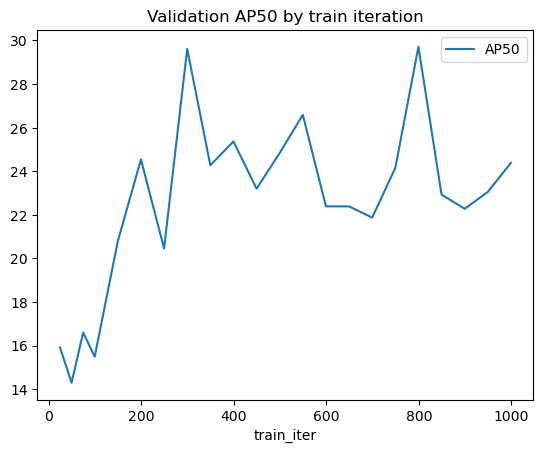

In [11]:
df_val.sort_values('train_iter').set_index('train_iter')[['AP50']].plot(title='Validation AP50 by train iteration')

In [12]:
best_model = df_val.iloc[df_val.AP50.idxmax()].fname
best_model

'data/output/model_0000799.pth'

## Test

In [45]:
cfg = test_cfg(best_model)

WARNING [11/14 23:24:35 d2.config.compat]: Config 'models/livecell-af.yaml' has no VERSION. Assuming it to be compatible with latest v2.


In [46]:
trainer = Trainer(cfg)
trainer.resume_or_load()

[11/14 23:24:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): VoVNet(
      (stem): Sequential(
        (stem_1/conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (stem_1/norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        (stem_1/relu): R

In [47]:
reregister_coco_instances('TEST', {}, f'data/cellvoyant/test_coco.json', f'data/cellvoyant/TrainTest')
evaluator = [centermask.evaluation.COCOEvaluator('TEST', cfg, False)]
Trainer.test(cfg, trainer.model, evaluator)

COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


[11/14 23:24:52 d2.data.datasets.coco]: Loaded 1 images in COCO format from data/cellvoyant/test_coco.json
[11/14 23:24:52 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/14 23:24:52 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/14 23:24:52 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[11/14 23:24:52 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/14 23:24:52 d2.evaluation.evaluator]: Start inference on 1 batches
[11/14 23:24:53 d2.evaluation.evaluator]: Inference done 1/1. Dataloading: 0.0000 s/iter. Inference: 0.1105 s/iter. Eval: 0.0358 s/iter. Total: 0.1463 s/iter. ETA=0:00:00
[11/14 23:24:53 d2.evaluation.evaluator]: Total inference time: 0:00:00.247022 (0.247022 s / iter per device, on 1 devices)
[11/14 23:24:53 d2.evaluation.evaluator]: Total inference pur

OrderedDict([('bbox',
              {'AP': 7.252440666021018,
               'AP50': 31.13045103754034,
               'AP75': 0.6779763342187878,
               'APs': 11.4735916177195,
               'APm': 8.106558277593203,
               'APl': nan}),
             ('segm',
              {'AP': 5.208500552787832,
               'AP50': 24.835858693214377,
               'AP75': 0.06387735547748323,
               'APs': 6.094282224337644,
               'APm': 8.853109154010394,
               'APl': nan})])

# Inference

In [13]:
cfg = test_cfg(best_model)

WARNING [11/15 10:31:09 d2.config.compat]: Config 'models/livecell-af.yaml' has no VERSION. Assuming it to be compatible with latest v2.


In [18]:
img = Image.open(os.path.join(IMAGES_DIR, os.path.basename(df_ds.query('`split` == "Test"').iloc[0]['fname']))).convert('RGB')

In [19]:
d = demo.VisualizationDemo(cfg)
pred, vis = d.run_on_image(np.array(img))

[11/15 10:32:32 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                                    | Names in Checkpoint                                                                               | Shapes                          |
|:------------------------------------------------------------------|:--------------------------------------------------------------------------------------------------|:--------------------------------|
| backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/conv.weight | backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/conv.weight                                 | (256, 768, 1, 1)                |
| backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/norm.*      | backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/norm.{bias,running_mean,running_var,weight} | (256,) (256,) (256,) (256,)     |
| backbone.bottom_up.stage2.OSA2_1.ese.fc.*                         | backbone.bottom_up.stage2.O

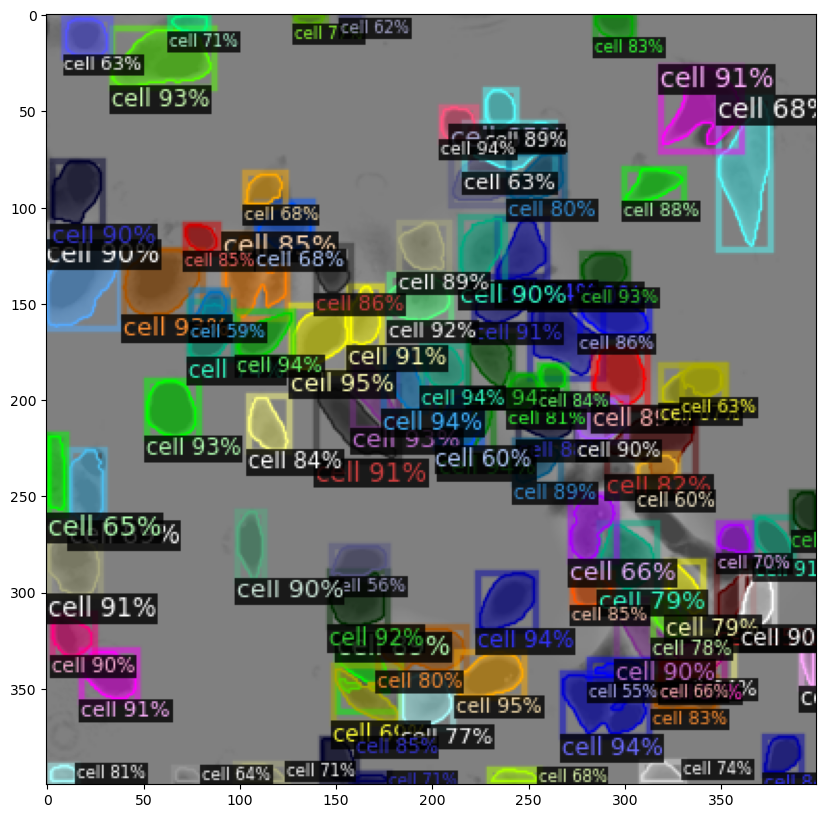

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(vis.get_image())

## Calculate stats

Stats are calculated for scaled images. It's possible to rescale stats back to original image size using `IMG_SCALE` coefficient.

In [21]:
df_ds = gen_ds()
df_test = df_ds.query('split == "Test"').copy()
df_test

,sequence,idx,fname,split,image_url
108,E11_11,1,data/cellvoyant/Test/E11_11-1.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
109,E11_11,2,data/cellvoyant/Test/E11_11-2.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
110,E11_11,3,data/cellvoyant/Test/E11_11-3.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
111,E11_11,4,data/cellvoyant/Test/E11_11-4.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
112,E11_11,5,data/cellvoyant/Test/E11_11-5.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
113,E11_11,6,data/cellvoyant/Test/E11_11-6.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
114,E11_11,7,data/cellvoyant/Test/E11_11-7.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
115,E11_11,8,data/cellvoyant/Test/E11_11-8.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
116,E11_11,9,data/cellvoyant/Test/E11_11-9.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...
117,E11_11,10,data/cellvoyant/Test/E11_11-10.ome_8bit.tif,Test,https://storage.googleapis.com/vslaykovsky/cv/...


In [61]:
def gen_stats(masks, scores):
    masks = masks[scores > THRESHOLD]
    result = {'cell_number': len(masks)}
    result['areas'] = np.sum(masks, axis=-1).sum(axis=-1)

    centroids = []
    for mask in masks:
        y, x = np.where(mask == True)
        y, x = int(np.mean(y)), int(np.mean(x))
        centroids.append((x, y))
    result['centroids'] = centroids
    result['density'] = np.sum(masks, axis=0)
    return result

In [62]:
cfg = test_cfg(best_model)
predictor = DefaultPredictor(cfg)
df_stats = []
for _, r in tqdm(df_test.iterrows(), total=len(df_test)):
    fname = os.path.join(IMAGES_DIR, os.path.basename(r.fname))
    pred = predictor(np.array(Image.open(fname).convert('RGB')))
    masks = pred['instances'].pred_masks.cpu().numpy()
    scores = pred['instances'].mask_scores.cpu().numpy()
    stats = gen_stats(masks, scores)
    stats['fname'] = r['fname']
    df_stats.append(stats)


df_stats = pd.DataFrame(df_stats)
df_stats

WARNING [11/15 11:02:43 d2.config.compat]: Config 'models/livecell-af.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[11/15 11:02:44 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                                    | Names in Checkpoint                                                                               | Shapes                          |
|:------------------------------------------------------------------|:--------------------------------------------------------------------------------------------------|:--------------------------------|
| backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/conv.weight | backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/conv.weight                                 | (256, 768, 1, 1)                |
| backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/norm.*      | backbone.bottom_up.stage2.OSA2_1.concat.OSA2_1_concat/norm.{bias,running_mean,running_var,weig

100%|██████████| 20/20 [00:03<00:00,  5.58it/s]


,cell_number,areas,centroids,density,fname
0,86,"[614, 697, 637, 401, 529, 1054, 602, 442, 438,...","[(230, 343), (141, 167), (239, 304), (113, 166...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-1.ome_8bit.tif
1,81,"[641, 1032, 158, 669, 1137, 711, 613, 573, 255...","[(237, 305), (289, 356), (77, 113), (141, 167)...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-2.ome_8bit.tif
2,86,"[661, 270, 395, 420, 637, 1075, 1110, 555, 699...","[(140, 167), (212, 56), (205, 181), (165, 157)...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-3.ome_8bit.tif
3,90,"[536, 652, 262, 1027, 403, 413, 627, 768, 1067...","[(247, 123), (140, 168), (212, 57), (59, 138),...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-4.ome_8bit.tif
4,83,"[1012, 734, 987, 971, 382, 659, 482, 272, 398,...","[(289, 357), (13, 92), (59, 137), (264, 165), ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-5.ome_8bit.tif
5,88,"[545, 793, 284, 667, 1016, 700, 1111, 666, 824...","[(247, 121), (12, 93), (213, 56), (140, 168), ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-6.ome_8bit.tif
6,87,"[647, 279, 459, 1155, 641, 376, 471, 1034, 472...","[(140, 168), (212, 56), (228, 175), (61, 22), ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-7.ome_8bit.tif
7,92,"[461, 766, 698, 589, 278, 1168, 593, 378, 978,...","[(227, 175), (13, 92), (230, 342), (31, 342), ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-8.ome_8bit.tif
8,87,"[935, 697, 596, 283, 620, 469, 444, 953, 1181,...","[(58, 137), (230, 343), (247, 121), (213, 56),...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-9.ome_8bit.tif
9,87,"[947, 337, 682, 472, 604, 493, 679, 277, 425, ...","[(58, 138), (148, 133), (230, 342), (227, 172)...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",data/cellvoyant/Test/E11_11-10.ome_8bit.tif


<AxesSubplot:title={'center':'Test set: cell number over time'}>

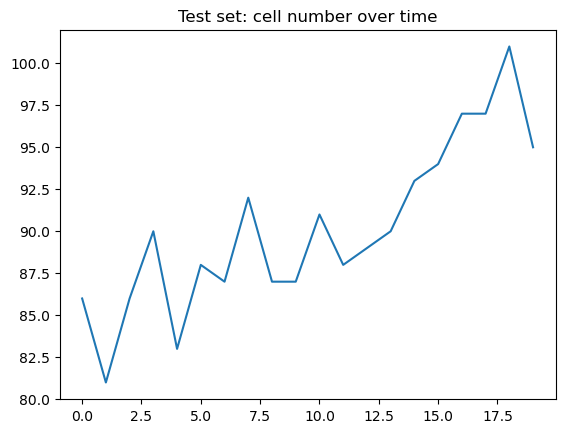

In [63]:
df_stats.cell_number.plot(title='Test set: cell number over time')

<AxesSubplot:title={'center':'Test set: total cell area over time'}>

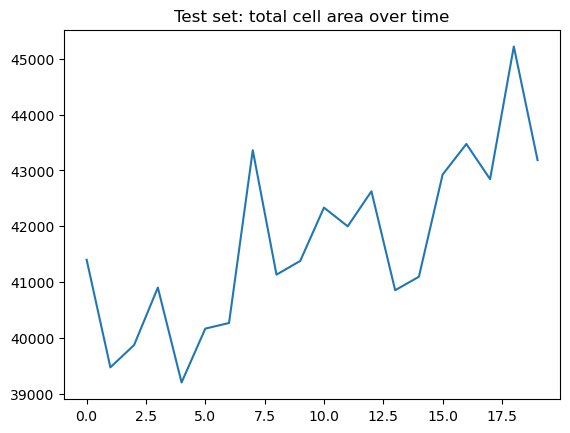

In [65]:
df_stats['total_area'] = [np.sum(area) for area in df_stats.areas]
df_stats.total_area.plot(title='Test set: total cell area over time')

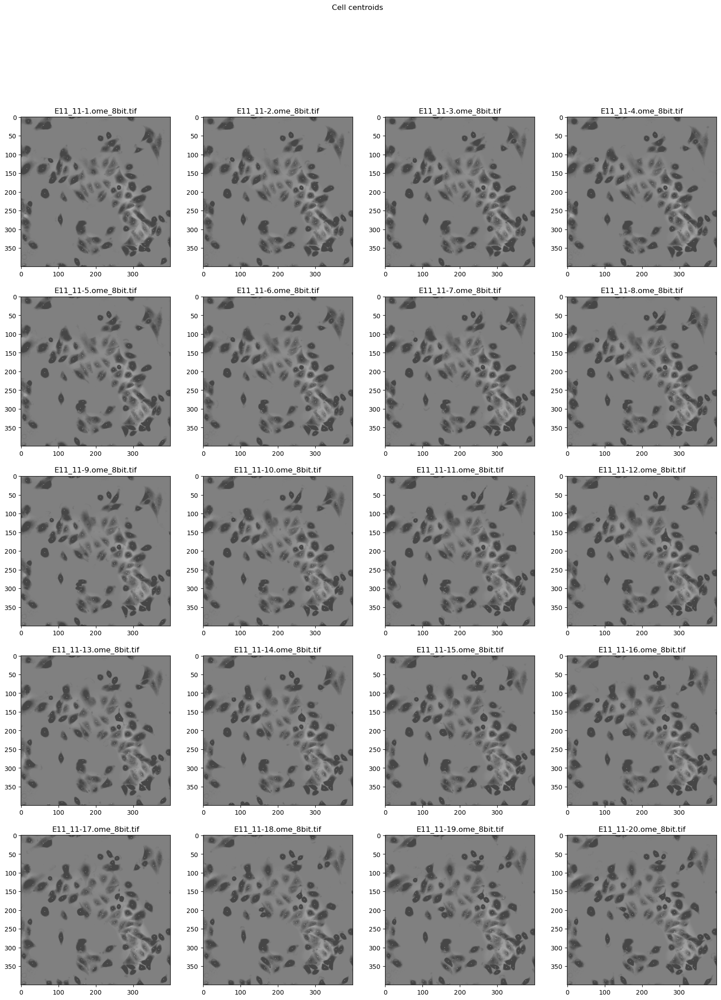

In [70]:
plt.figure(figsize=(20, 25))
plt.suptitle("Cell centroids")
for i, (_, r) in enumerate(df_stats.iterrows()):
    fname = os.path.join(IMAGES_DIR, os.path.basename(r.fname))
    img = Image.open(fname).convert('RGB')
    draw = ImageDraw.Draw(img)
    draw.point(r.centroids)
    plt.subplot(5, 4, i + 1).imshow(img)
    plt.subplot(5, 4, i + 1).set_title(os.path.basename(fname))

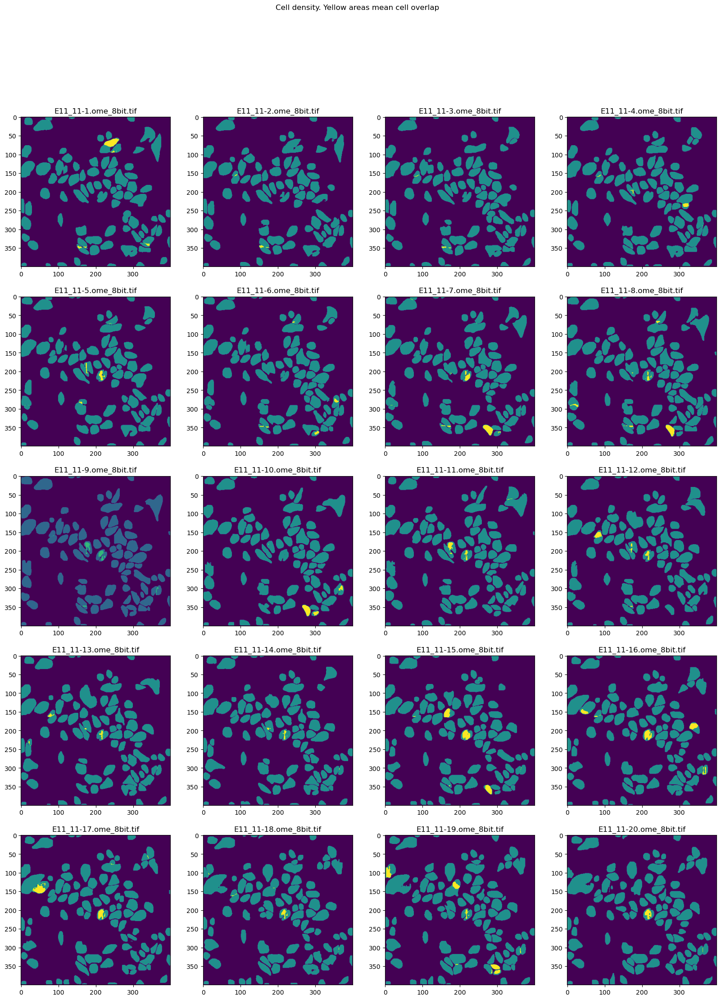

In [69]:
plt.figure(figsize=(20, 25))
plt.suptitle("Cell density. Yellow areas mean cell overlap")
for i, (_, r) in enumerate(df_stats.iterrows()):
    plt.subplot(5, 4, i + 1).imshow(r.density)
    plt.subplot(5, 4, i + 1).set_title(os.path.basename(r.fname))